In [5]:
!pip install torchvision
from UTKFaceDataset import *
from UTKFaceModelTrainer import *
from UTKFaceUtils import *
from model import *
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision.transforms import ToTensor, transforms
from tqdm import tqdm
from torch.optim import lr_scheduler
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

Defaulting to user installation because normal site-packages is not writeable


In [6]:
# Define the transformation pipeline
# https://www.geeksforgeeks.org/how-to-normalize-images-in-pytorch/#
# if no image is provided
data_transforms = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5904, 0.4462, 0.3769], std=[0.2177, 0.1899, 0.1799])
])

# balanced dir_path, transformed for vgg
val_dataset = UTKFaceDataset(dir_path='UTKFACE_val', transform=data_transforms)

# Create data loaders for train and test sets
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=True)

# Create a random sampler for the train dataset
# set to a small number for troubleshooting
val_sampler = torch.utils.data.RandomSampler(val_dataset, replacement=True, num_samples=32)

val_sample_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, sampler=val_sampler)

# device
device = "cpu"

In [3]:
import pandas as pd

utkface_df = pd.read_csv('UTKFACE_val.csv')
utkface_df.head()

,age,gender,race,date,file_path
0,1,0,2.0,2.016122e+16,UTKFACE_val/1_0_2_20161219155850477.jpg.chip.jpg
1,58,0,0.0,2.017012e+16,UTKFACE_val/58_0_0_20170117160331768.jpg.chip.jpg
2,36,0,3.0,2.017012e+16,UTKFACE_val/36_0_3_20170119201744493.jpg.chip.jpg
3,27,0,4.0,2.017012e+16,UTKFACE_val/27_0_4_20170117202219111.jpg.chip.jpg
4,36,0,1.0,2.017012e+16,UTKFACE_val/36_0_1_20170117183213758.jpg.chip.jpg


In [8]:
# use the model package to load the model and then load the trained weights
model = Model(model_name = "vgg16", version = 1, num_classes = 116, pretrained = True) 
model.load_state_dict(torch.load('vgg16_pretrained_1.pth'))
model_name = "vgg16"

# Preprocess the images
preprocess = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5904, 0.4462, 0.3769], std=[0.2177, 0.1899, 0.1799])
])

for i in range(len(utkface_df)):
    path = utkface_df['file_path'][i]
    img = Image.open(path)
    img_t = preprocess(img)
    img_u = torch.unsqueeze(img_t, 0)

    # Run the model on the image
    with torch.no_grad():
        img_u = img_u.to(device)
        predictions = []
        for _ in range(20):
            outputs = model(img_u)
            _, predicted = torch.max(torch.softmax(outputs, dim=1), dim=-1)
            predictions.append(predicted.item())
        predicted_mode = torch.mode(torch.tensor(predictions)).values.item() 
        uncertainty = torch.std(torch.tensor(predictions, dtype=torch.float), dim=0)
    
    # Add the predicted value to the corresponding row in utkface_df
    utkface_df.loc[i, f'{model_name}_pred'] = predicted_mode
    utkface_df.loc[i, f'{model_name}_uncertainty'] = uncertainty.item()

Using cache found in /home/repl/.cache/torch/hub/pytorch_vision_v0.9.0


In [10]:
utkface_df

,age,gender,race,date,file_path,vgg16_pred,vgg16_uncertainty
0,1,0,2.0,2.016122e+16,UTKFACE_val/1_0_2_20161219155850477.jpg.chip.jpg,3.0,1.518309
1,58,0,0.0,2.017012e+16,UTKFACE_val/58_0_0_20170117160331768.jpg.chip.jpg,45.0,3.963983
2,36,0,3.0,2.017012e+16,UTKFACE_val/36_0_3_20170119201744493.jpg.chip.jpg,70.0,12.947262
3,27,0,4.0,2.017012e+16,UTKFACE_val/27_0_4_20170117202219111.jpg.chip.jpg,30.0,2.742934
4,36,0,1.0,2.017012e+16,UTKFACE_val/36_0_1_20170117183213758.jpg.chip.jpg,26.0,9.092941
...,...,...,...,...,...,...,...
1995,50,1,0.0,2.017011e+16,UTKFACE_val/50_1_0_20170109220459927.jpg.chip.jpg,72.0,1.788854
1996,1,0,2.0,2.016122e+16,UTKFACE_val/1_0_2_20161219151123435.jpg.chip.jpg,1.0,0.670820
1997,27,1,2.0,2.017012e+16,UTKFACE_val/27_1_2_20170116163645443.jpg.chip.jpg,18.0,4.806793
1998,26,1,2.0,2.017012e+16,UTKFACE_val/26_1_2_20170116184656151.jpg.chip.jpg,52.0,10.307892


In [12]:
utkface_df.to_csv('vgg16_interpretable_inference.csv')

In [14]:
interp_sample_df = pd.read_csv('vgg16_interpretable_inference.csv')
interp_sample_df = interp_sample_df.drop(columns=['Unnamed: 0'])
interp_group_age = interp_sample_df.groupby('age').agg({'vgg16_pred': 'mean', 'vgg16_uncertainty': 'mean'})
interp_group_gender = interp_sample_df.groupby(['age', 'gender']).agg({'vgg16_pred': 'mean', 'vgg16_uncertainty': 'mean'})
interp_group_race = interp_sample_df.groupby(['age', 'race']).agg({'vgg16_pred': 'mean', 'vgg16_uncertainty': 'mean'})

In [15]:
interp_group_race

vgg16_pred  vgg16_uncertainty
age race                               
1   0.0     1.408163           2.462016
    1.0     1.000000           0.751408
    2.0     1.771739           1.375543
    3.0     2.089286           1.476077
    4.0     4.064516           2.427732
...              ...                ...
96  2.0    96.000000          10.620115
99  0.0    94.000000           3.557520
100 0.0    87.000000           4.724568
    2.0    84.000000           4.212514
101 0.0    70.000000           3.360373

[253 rows x 2 columns]

Using cache found in /home/repl/.cache/torch/hub/pytorch_vision_v0.9.0
Evaluating: 100%|██████████| 63/63 [06:40<00:00,  6.36s/it]


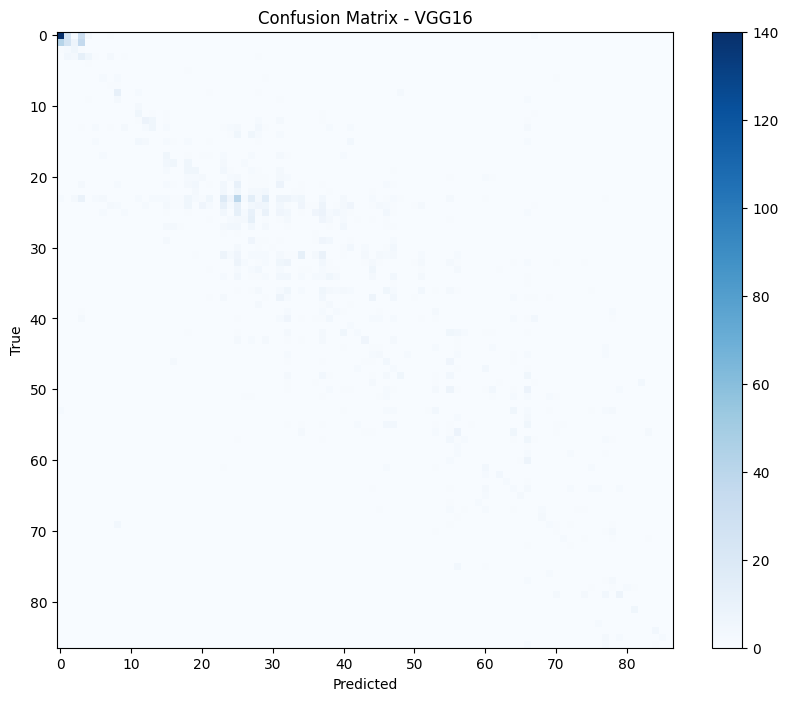

Classification Report - VGG16:
              precision    recall  f1-score   support

           1       0.75      0.69      0.72       203
           2       0.45      0.23      0.30       110
           3       0.25      0.56      0.34         9
           4       0.12      0.40      0.19        30
           5       0.10      1.00      0.18         1
           6       0.00      0.00      0.00         1
           8       0.22      0.33      0.27         6
           9       0.11      0.50      0.18         2
          10       0.44      0.61      0.51        18
          11       0.00      0.00      0.00         7
          12       0.00      0.00      0.00         3
          14       0.29      0.56      0.38         9
          15       0.53      0.36      0.43        22
          16       0.38      0.15      0.21        34
          17       0.00      0.00      0.00        15
          18       0.06      0.09      0.08        22
          19       0.00      0.00      0.00       

In [16]:
import torch
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
from model import *

vgg16 = Model(model_name = "vgg16", version = 1, num_classes = 116, pretrained = True)
vgg16.load_state_dict(torch.load('vgg16_pretrained_1.pth'))
#resnet50 = Model(model_name = "resnet50", num_classes = 116, pretrained = True)

device = 'cpu'

def evaluate_model(model, data_loader, device):
    model.eval()
    y_true = []
    y_pred = []
    
    with torch.no_grad():
         for i in tqdm(range(len(data_loader)), desc='Evaluating'):
            try:
                next_element = next(iter(data_loader))
            except:
                continue
            images = next_element['image'].to(device)
            labels = next_element['label']['age'].to(device)
            
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            
            y_true.extend(labels.cpu().numpy())
            y_pred.extend(predicted.cpu().numpy())
    
    cm = confusion_matrix(y_true, y_pred)
    report = classification_report(y_true, y_pred)
    
    return cm, report

# Evaluate the performance of the vgg16 model
vgg16_cm, vgg16_report = evaluate_model(vgg16, val_loader, device)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
plt.imshow(vgg16_cm, cmap='Blues')
plt.title('Confusion Matrix - VGG16')
plt.colorbar()
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Print the classification report
print('Classification Report - VGG16:')
print(vgg16_report)

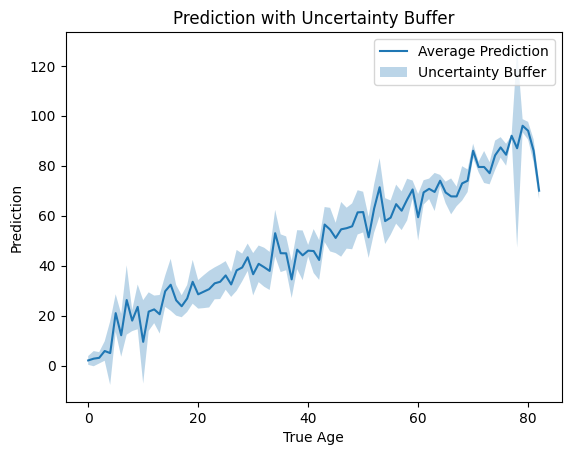

In [19]:
import numpy as np
import matplotlib.pyplot as plt

interp_sample_df = pd.read_csv('vgg16_interpretable_inference.csv')
interp_sample_df = interp_sample_df.drop(columns=['Unnamed: 0'])
interp_group_age = interp_sample_df.groupby('age').agg({'vgg16_pred': 'mean', 'vgg16_uncertainty': 'mean'})
interp_group_gender = interp_sample_df.groupby(['age', 'gender']).agg({'vgg16_pred': 'mean', 'vgg16_uncertainty': 'mean'})

# Generate ages from 0 to 116
ages = np.arange(0, len(interp_group_age))

# Generate average prediction and variance for each age
# average_prediction should be the same size as ages
# average_prediction = ages + np.random.uniform(0, 4, size=len(ages))
# variance = (2 + np.random.uniform(0, 3, size=len(ages)))**2

average_prediction = interp_group_age['vgg16_pred']
variance = interp_group_age['vgg16_uncertainty']**2

# Calculate upper and lower bounds for uncertainty buffer
upper_bound = average_prediction + np.sqrt(variance)
lower_bound = average_prediction - np.sqrt(variance)

# Plot the line chart with uncertainty buffer
plt.plot(ages, average_prediction, label='Average Prediction')
plt.fill_between(ages, lower_bound, upper_bound, alpha=0.3, label='Uncertainty Buffer')
plt.xlabel('True Age')
plt.ylabel('Prediction')
plt.title('Prediction with Uncertainty Buffer')
plt.legend()
plt.show()

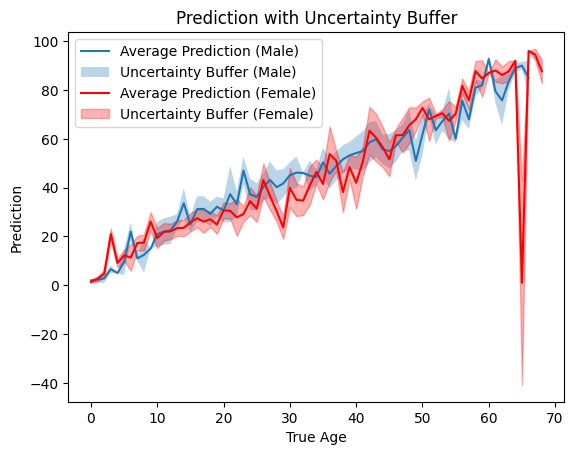

In [10]:
import numpy as np
import matplotlib.pyplot as plt

interp_sample_df = pd.read_csv('vgg16_interpretable_inference.csv')
interp_sample_df = interp_sample_df.drop(columns=['Unnamed: 0'])
interp_group_gender = interp_sample_df.groupby(['age', 'gender']).agg({'vgg16_pred': 'mean', 'vgg16_uncertainty': 'mean'}).reset_index()

male_interp = interp_group_gender[interp_group_gender['gender']==0]
female_interp = interp_group_gender[interp_group_gender['gender']==1]

# Generate ages from 0 to 116
ages = np.arange(0, len(male_interp))

average_prediction = male_interp['vgg16_pred']
variance = male_interp['vgg16_uncertainty']**2

# Calculate upper and lower bounds for uncertainty buffer
upper_bound = average_prediction + np.sqrt(variance)
lower_bound = average_prediction - np.sqrt(variance)

# Plot the line chart with uncertainty buffer
plt.plot(ages, average_prediction, label='Average Prediction (Male)')
plt.fill_between(ages, lower_bound, upper_bound, alpha=0.3, label='Uncertainty Buffer (Male)')

ages = np.arange(0, len(female_interp))

average_prediction = female_interp['vgg16_pred']
variance = female_interp['vgg16_uncertainty']**2

# Calculate upper and lower bounds for uncertainty buffer
upper_bound = average_prediction + np.sqrt(variance)
lower_bound = average_prediction - np.sqrt(variance)

# Plot the line chart with uncertainty buffer
plt.plot(ages, average_prediction, label='Average Prediction (Female)', color='red')
plt.fill_between(ages, lower_bound, upper_bound, alpha=0.3, label='Uncertainty Buffer (Female)', color='red')

plt.xlabel('True Age')
plt.ylabel('Predicted Age')
plt.title('Age Estimation with Uncertainty Buffer')
plt.legend()
plt.show()

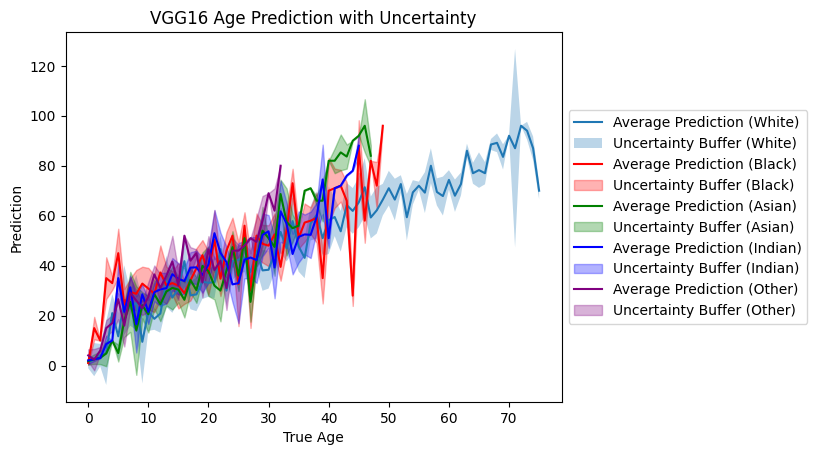

In [21]:
import numpy as np
import matplotlib.pyplot as plt

interp_sample_df = pd.read_csv('vgg16_interpretable_inference.csv')
interp_sample_df = interp_sample_df.drop(columns=['Unnamed: 0'])
interp_group_gender = interp_sample_df.groupby(['age', 'race']).agg({'vgg16_pred': 'mean', 'vgg16_uncertainty': 'mean'}).reset_index()

race_0 = interp_group_gender[interp_group_gender['race']==0]
race_1 = interp_group_gender[interp_group_gender['race']==1]
race_2 = interp_group_gender[interp_group_gender['race']==2]
race_3 = interp_group_gender[interp_group_gender['race']==3]
race_4 = interp_group_gender[interp_group_gender['race']==4]

# Generate ages from 0 to 116
ages = np.arange(0, len(race_0))

average_prediction = race_0['vgg16_pred']
variance = race_0['vgg16_uncertainty']**2

# Calculate upper and lower bounds for uncertainty buffer
upper_bound = average_prediction + np.sqrt(variance)
lower_bound = average_prediction - np.sqrt(variance)

# Plot the line chart with uncertainty buffer
plt.plot(ages, average_prediction, label='Average Prediction (White)')
plt.fill_between(ages, lower_bound, upper_bound, alpha=0.3, label='Uncertainty Buffer (White)')

ages = np.arange(0, len(race_1))

average_prediction = race_1['vgg16_pred']
variance = race_1['vgg16_uncertainty']**2

# Calculate upper and lower bounds for uncertainty buffer
upper_bound = average_prediction + np.sqrt(variance)
lower_bound = average_prediction - np.sqrt(variance)

# Plot the line chart with uncertainty buffer
plt.plot(ages, average_prediction, label='Average Prediction (Black)', color='red')
plt.fill_between(ages, lower_bound, upper_bound, alpha=0.3, label='Uncertainty Buffer (Black)', color='red')

ages = np.arange(0, len(race_2))

average_prediction = race_2['vgg16_pred']
variance = race_2['vgg16_uncertainty']**2

# Calculate upper and lower bounds for uncertainty buffer
upper_bound = average_prediction + np.sqrt(variance)
lower_bound = average_prediction - np.sqrt(variance)

# Plot the line chart with uncertainty buffer
plt.plot(ages, average_prediction, label='Average Prediction (Asian)', color='green')
plt.fill_between(ages, lower_bound, upper_bound, alpha=0.3, label='Uncertainty Buffer (Asian)', color='green')

ages = np.arange(0, len(race_3))

average_prediction = race_3['vgg16_pred']
variance = race_3['vgg16_uncertainty']**2

# Calculate upper and lower bounds for uncertainty buffer
upper_bound = average_prediction + np.sqrt(variance)
lower_bound = average_prediction - np.sqrt(variance)

# Plot the line chart with uncertainty buffer
plt.plot(ages, average_prediction, label='Average Prediction (Indian)', color='blue')
plt.fill_between(ages, lower_bound, upper_bound, alpha=0.3, label='Uncertainty Buffer (Indian)', color='blue')

ages = np.arange(0, len(race_4))

average_prediction = race_4['vgg16_pred']
variance = race_4['vgg16_uncertainty']**2

# Calculate upper and lower bounds for uncertainty buffer
upper_bound = average_prediction + np.sqrt(variance)
lower_bound = average_prediction - np.sqrt(variance)

# Plot the line chart with uncertainty buffer
plt.plot(ages, average_prediction, label='Average Prediction (Other)', color='purple')
plt.fill_between(ages, lower_bound, upper_bound, alpha=0.3, label='Uncertainty Buffer (Other)', color='purple')

plt.xlabel('True Age')
plt.ylabel('Prediction')
plt.title('VGG16 Age Prediction with Uncertainty')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Saliency Maps

In [22]:
#define transforms to preprocess input image into format expected by model
normalize = transforms.Normalize(mean=[0.5904, 0.4462, 0.3769], 
                                std=[0.2177, 0.1899, 0.1799])
#inverse transform to get normalize image back to original form for visualization
inv_normalize = transforms.Normalize(
    mean=[-0.5904/0.2177, -0.4462/0.1899, -0.3769/0.1799],
    std=[1/0.2177, 1/0.1899, 1/0.1799]
)

#transforms to resize image to the size expected by pretrained model,
#convert PIL image to tensor, and
#normalize the image
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5904, 0.4462, 0.3769], 
                         std=[0.2177, 0.1899, 0.1799])
])

In [31]:
import numpy as np
import matplotlib.pyplot as plt

#https://github.com/sunnynevarekar/pytorch-saliency-maps/blob/master/Saliency_maps_in_pytorch.ipynb
def saliency(img, model):
    #we don't need gradients w.r.t. weights for a trained model
    for param in model.parameters():
        param.requires_grad = False
    
    #set model in eval mode
    model.eval()
    #transoform input PIL image to torch.Tensor and normalize
    input = transform(img)
    input.unsqueeze_(0)

    #we want to calculate gradient of higest score w.r.t. input
    #so set requires_grad to True for input 
    input.requires_grad = True
    #forward pass to calculate predictions
    preds = model(input)
    score, indices = torch.max(preds, 1)
    #backward pass to get gradients of score predicted class w.r.t. input image
    score.backward()
    #get max along channel axis
    slc, _ = torch.max(torch.abs(input.grad[0]), dim=0)
    #normalize to [0..1]
    slc = (slc - slc.min())/(slc.max()-slc.min())

    #apply inverse transform on image
    with torch.no_grad():
        input_img = inv_normalize(input[0])
    #plot image and its saleincy map
    plt.figure(figsize=(10, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(input_img.detach().numpy().transpose(1, 2, 0))
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1, 2, 2)
    plt.imshow(slc.numpy(), cmap=plt.cm.hot)
    plt.xticks([])
    plt.yticks([])
    plt.show()
    return slc.numpy()

Using cache found in /home/repl/.cache/torch/hub/pytorch_vision_v0.9.0


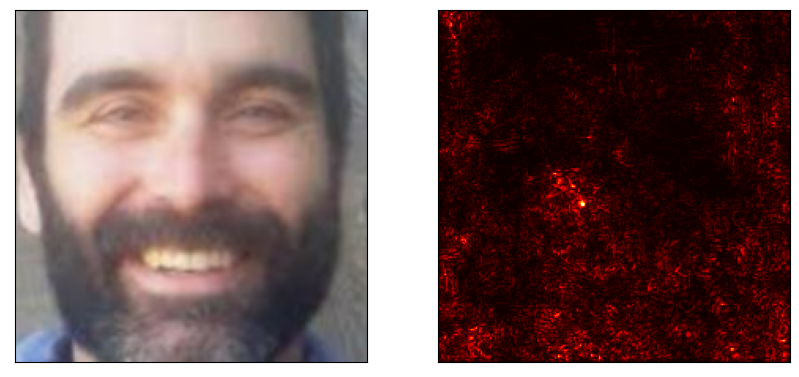

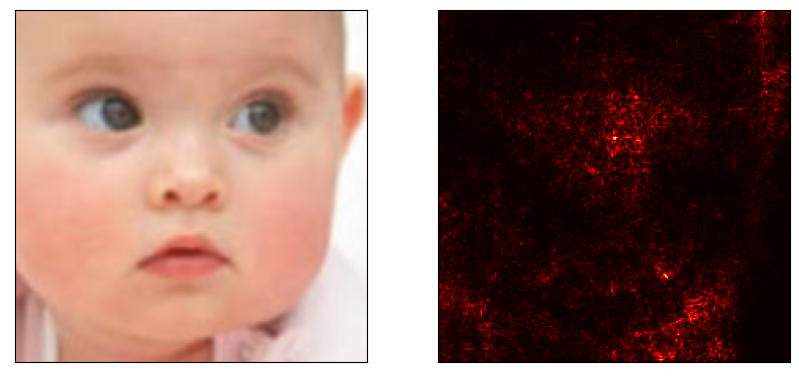

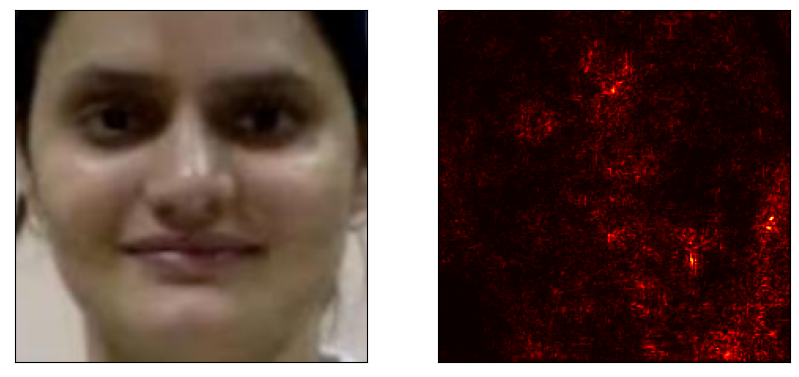

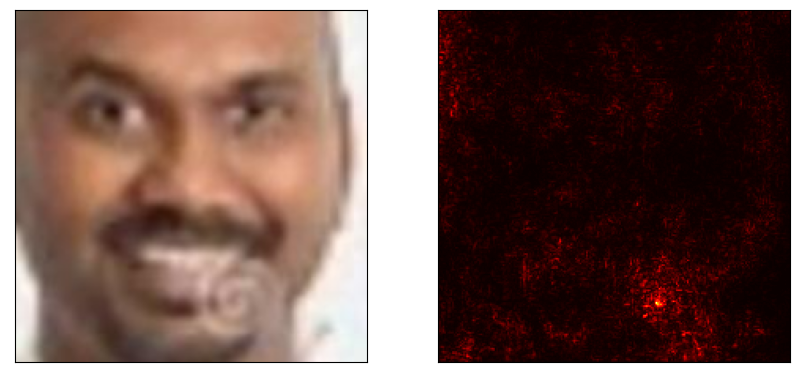

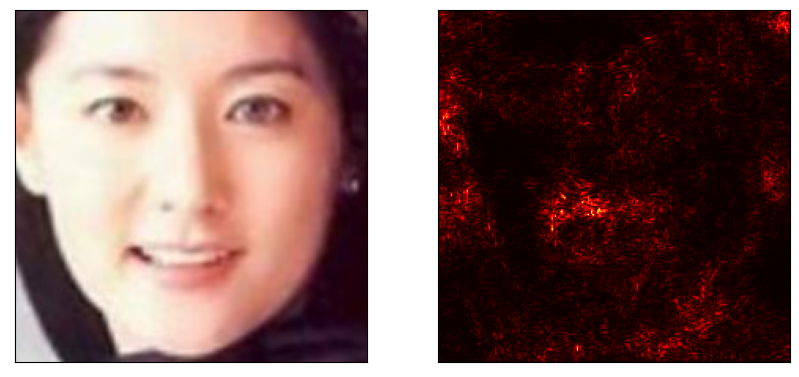

...

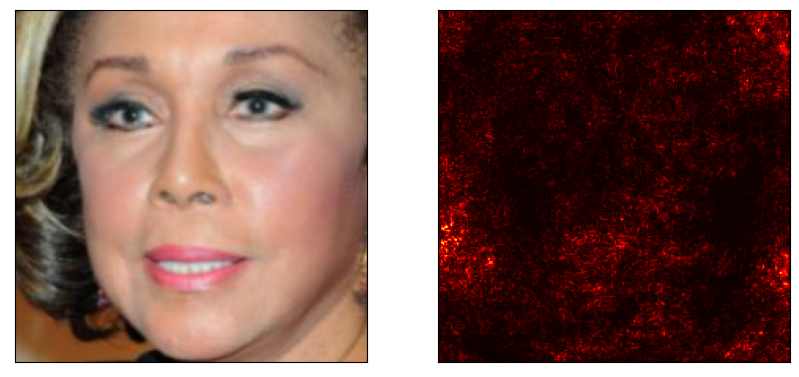

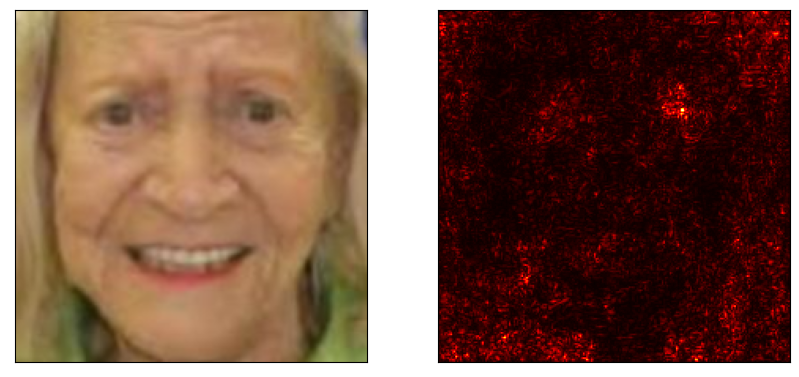

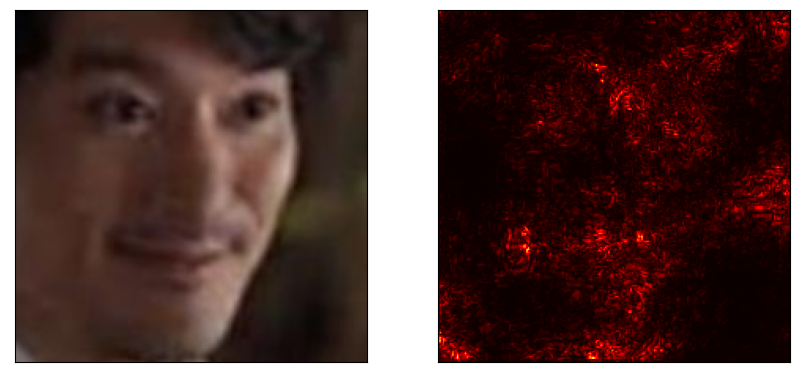

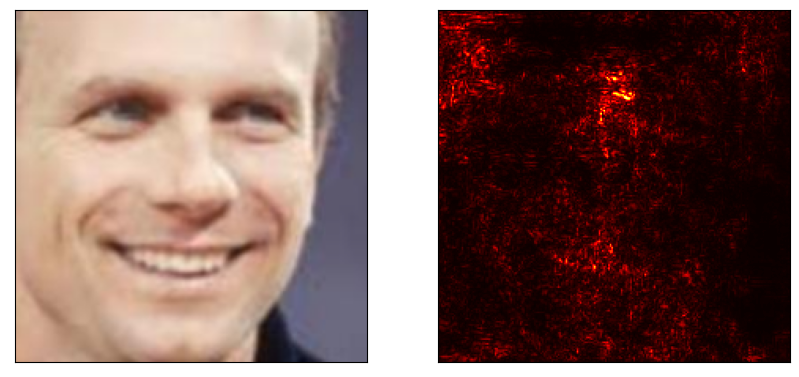

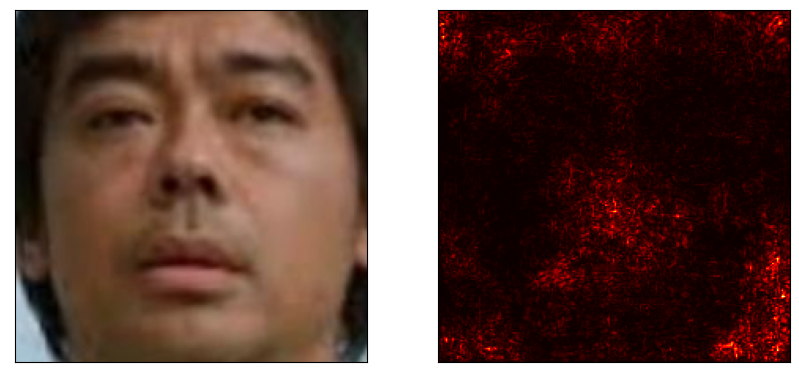

In [39]:
from PIL import Image
import os
import random

model = Model(model_name = "vgg16",version = 1, num_classes = 116, pretrained = True)
model.load_state_dict(torch.load('vgg16_pretrained_1.pth'))

val_folder = 'UTKFACE_val'
val_files = os.listdir(val_folder)

random_file = random.choice(val_files)
img_path = os.path.join(val_folder, random_file)

combined_array = np.zeros((224, 224))
for i in range(40):
    random_file = random.choice(val_files)
    img_path = os.path.join(val_folder, random_file)

    img = Image.open(img_path)
    combined_array = saliency(img, model) + combined_array

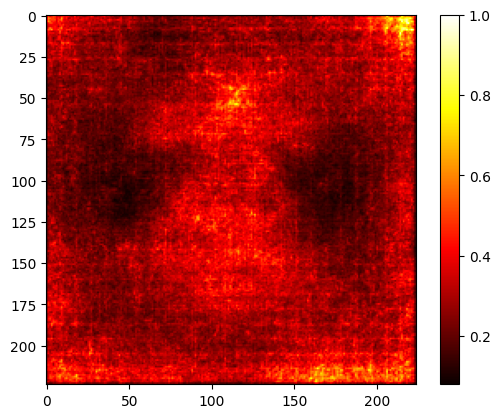

In [40]:
import matplotlib.pyplot as plt

normalized_array = combined_array / np.max(combined_array)

plt.imshow(normalized_array, cmap=plt.cm.hot)
plt.colorbar()
plt.show()